# Imports

In [1]:
import numpy as np
import pandas as pd
from datetime import datetime

import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from plotly.colors import sample_colorscale

import time
import sys
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

import vectorbt as vbt
import arcticdb as adb
from scipy.stats import rankdata, spearmanr
from statsmodels.tsa.stattools import adfuller
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

import pandas_ta as ta

from typing import List, Union, Tuple

import matplotlib.pyplot as plt
import seaborn as sns

# <br><br> Built-in functions

In [2]:

def qc_nan_adf_corr(data: pd.DataFrame, feats: List[str], top_n: int = 30) -> Tuple[pd.Series, pd.Series, pd.DataFrame]:
    """Return NaN fractions, ADF p-values, and Spearman corr; plot compact QC."""
    nan_summary = data[feats].isna().mean().sort_values(ascending=False)

    def adf_pvalue(s: pd.Series) -> float:
        s = s.dropna()
        if len(s) < 10: return np.nan
        try: return adfuller(s, autolag="AIC")[1]
        except Exception: return np.nan

    adf_series = pd.Series({f: adf_pvalue(data[f]) for f in feats})
    corr = data[feats].corr(method="spearman")

    print("\n=== Missing Values (fraction) ===")
    print(nan_summary.head(20).round(3))
    print("\n=== ADF Stationarity Test (p-values) ===")
    print(adf_series.sort_values().head(20).round(4))
    print("(p < 0.05 => likely stationary)")

    fig, axs = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)
    nan_summary.head(top_n).plot(kind="barh", ax=axs[0], color="tab:gray")
    axs[0].invert_yaxis(); axs[0].set_title("Top NaN fraction"); axs[0].set_xlabel("fraction")
    adf_series.dropna().sort_values().head(top_n).plot(kind="barh", ax=axs[1], color="tab:blue")
    axs[1].invert_yaxis(); axs[1].set_title("ADF p-values (lower=more stationary)"); axs[1].set_xlabel("p-value")
    plt.show()

    plt.figure(figsize=(9, 7))
    sns.heatmap(corr, cmap="coolwarm", center=0, linewidths=0.2)
    plt.title("Spearman Correlation Matrix")
    plt.tight_layout(); plt.show()

    return nan_summary, adf_series, corr


# ---------- B) PREDICTIVE POWER (IC/MI + RANDOMIZATION) ----------

def _compute_ic(x: pd.Series, y: pd.Series) -> float:
    s = pd.concat([x, y], axis=1).dropna()
    if s.empty: return np.nan
    return spearmanr(s.iloc[:, 0], s.iloc[:, 1]).correlation

def _compute_mi(x: pd.Series, y: pd.Series, is_cls: bool) -> float:
    s = pd.concat([x, y], axis=1).dropna()
    if s.empty: return np.nan
    X = s[[x.name]].values; Y = s[y.name].values
    return (mutual_info_classif(X, Y, random_state=0)[0]
            if is_cls else mutual_info_regression(X, Y, random_state=0)[0])

def _rand_test(x: pd.Series, y: pd.Series, is_cls: bool, n_iter: int) -> Tuple[float, float, float, float, float]:
    """Return IC, MI, z(|IC|), z(MI), |IC| using shuffled-target baseline."""
    s = pd.concat([x, y], axis=1).dropna()
    if len(s) < 30: return np.nan, np.nan, np.nan, np.nan, np.nan

    X = s[[x.name]].values; Y = s[y.name].values
    ic_true = spearmanr(s.iloc[:, 0], s.iloc[:, 1]).correlation
    ic_abs = abs(ic_true)
    mi_true = (mutual_info_classif(X, Y, random_state=0)[0]
               if is_cls else mutual_info_regression(X, Y, random_state=0)[0])

    rng = np.random.default_rng(0)
    ric, rmi = [], []
    for _ in range(n_iter):
        y_sh = rng.permutation(Y)
        ric.append(spearmanr(s.iloc[:, 0], y_sh).correlation)
        rmi.append(mutual_info_classif(X, y_sh, random_state=0)[0]
                   if is_cls else mutual_info_regression(X, y_sh, random_state=0)[0])

    ric, rmi = np.asarray(ric), np.asarray(rmi)
    ic_z_abs = (ic_abs - np.nanmean(np.abs(ric))) / (np.nanstd(np.abs(ric)) + 1e-9)
    mi_z = (mi_true - np.nanmean(rmi)) / (np.nanstd(rmi) + 1e-9)
    return ic_true, mi_true, ic_z_abs, mi_z, ic_abs

def compute_predictive_power(data: pd.DataFrame,
                             target_col: str,
                             feats: List[str],
                             n_iter: int,
                             z_thresh: float) -> pd.DataFrame:
    """Return rank_df with IC/MI, z-scores, CompositePower, AvgRank, Significant flag."""
    y = data[target_col]
    is_cls = len(y.dropna().unique()) == 2

    rows = []
    for f in feats:
        ic, mi, ic_z_abs, mi_z, ic_abs = _rand_test(data[f], y, is_cls, n_iter)
        comp = (ic_abs if pd.notna(ic_abs) else np.nan) + 0.5 * (mi if pd.notna(mi) else 0.0)
        rows.append([f, ic, ic_abs, mi, ic_z_abs, mi_z, comp])

    df = pd.DataFrame(rows, columns=["Feature", "IC", "IC_abs", "MI", "IC_z_abs", "MI_z", "CompositePower"]).set_index("Feature")
    df = df[~df.index.duplicated(keep="first")]
    df["Significant"] = (df["IC_z_abs"] > z_thresh) & (df["MI_z"] > z_thresh)

    rank_df = df.copy()
    rank_df["IC_rank"] = rank_df["IC_abs"].rank(ascending=False, method="average")
    rank_df["MI_rank"] = rank_df["MI"].rank(ascending=False, method="average")
    rank_df["CompositePower_rank"] = rank_df["CompositePower"].rank(ascending=False, method="average")
    rank_df["AvgRank"] = rank_df[["IC_rank", "MI_rank", "CompositePower_rank"]].mean(axis=1)
    rank_df = rank_df.sort_values("AvgRank")

    print("\n=== Predictive Power Summary (|IC| randomization; BOTH must pass) ===")
    print(rank_df[["IC","IC_abs","IC_z_abs","MI","MI_z","CompositePower","Significant","AvgRank"]].round(4).head(20))
    print(f"\n✅ {int(rank_df['Significant'].sum())}/{len(rank_df)} features passed (IC_z_abs & MI_z > {z_thresh})")
    return rank_df


# ---------- C) PREDICTIVE POWER PLOTS (COMPACT BOARD) ----------

def plot_compact_board(rank_df: pd.DataFrame, z_thresh: float = 2.0, top_n: int = 30) -> None:
    """2x2 board: IC, MI (with significance), CompositePower, AvgRank (all top-N)."""
    top_idx_ic = rank_df["IC_abs"].sort_values(ascending=False).head(top_n).index
    top_idx_mi = rank_df["MI"].sort_values(ascending=False).head(top_n).index
    top_idx_comp = rank_df["CompositePower"].sort_values(ascending=False).head(top_n).index
    top_idx_avgr = rank_df["AvgRank"].sort_values().head(top_n).index

    fig, axs = plt.subplots(2, 2, figsize=(14, 8), constrained_layout=True)

    # IC
    s = rank_df.loc[top_idx_ic, "IC"]; z = rank_df.loc[top_idx_ic, "IC_z_abs"]
    colors = ["tab:blue" if (zv>z_thresh and val>=0) else ("tab:orange" if (zv>z_thresh and val<0) else "lightgray")
              for val, zv in zip(s.values, z.values)]
    axs[0,0].barh(s.index, s.values, color=colors); axs[0,0].axvline(0, lw=0.8, c="k", alpha=0.4)
    axs[0,0].set_title("Spearman IC (color = significant |IC|)"); axs[0,0].invert_yaxis()

    # MI
    s = rank_df.loc[top_idx_mi, "MI"]; z = rank_df.loc[top_idx_mi, "MI_z"]
    colors = ["tab:green" if zv>z_thresh else "lightgray" for zv in z.values]
    axs[0,1].barh(s.index, s.values, color=colors); axs[0,1].set_title("Mutual Information (green=significant)")
    axs[0,1].invert_yaxis()

    # Composite
    s = rank_df.loc[top_idx_comp, "CompositePower"]
    axs[1,0].barh(s.index, s.values, color="tab:blue"); axs[1,0].axvline(0, lw=0.8, c="k", alpha=0.4)
    axs[1,0].set_title("Composite Power (|IC| + 0.5×MI)"); axs[1,0].invert_yaxis()

    # AvgRank
    s = rank_df.loc[top_idx_avgr, "AvgRank"]
    axs[1,1].barh(s.index, s.values, color="gray"); axs[1,1].set_title("Average Rank (lower = better)")
    axs[1,1].invert_yaxis()
    plt.show()


# ---------- D) QUINTILE PLOTS (DECILE-STYLE FEATURES) ----------

def _looks_like_decile(s: pd.Series) -> bool:
    s = pd.to_numeric(s, errors="coerce").dropna()
    if len(s) == 0: return False
    mn, mx = float(s.min()), float(s.max())
    within = (mn >= 1 - 1e-9) and (mx <= 10 + 1e-9)
    uniq = pd.unique(np.floor(s.values + 1e-9))
    return within and (len(uniq) <= 10)

def prepare_decile_features(data: pd.DataFrame, feats: List[str]) -> List[str]:
    out = []
    for f in feats:
        col = data[f]
        if col.dropna().empty: continue
        if f.endswith("_d") or f.endswith("_q") or _looks_like_decile(col): out.append(f)
    return out

def _decile_to_quintile(col: pd.Series) -> pd.Series:
    return ((col - 1) // 2 + 1).astype("Int64")

def _quintile_mean(df: pd.DataFrame, f: str, ycol: str) -> pd.Series:
    t = df[[f, ycol]].dropna().copy()
    if t.empty: return pd.Series([np.nan]*5, index=[1,2,3,4,5], dtype=float)
    t["quintile"] = _decile_to_quintile(t[f])
    s = t.groupby("quintile")[ycol].mean()
    return s.reindex([1,2,3,4,5])

def plot_quintile_grids(data: pd.DataFrame,
                        target_col: str,
                        feats: List[str],
                        rank_df: pd.DataFrame,
                        max_plots_per_fig: int = 30,
                        ncols: int = 6,
                        cell_wh: Tuple[float, float] = (1.8, 1.5)) -> None:
    """Bar of target mean by quintile. Blue if Significant, grey otherwise."""
    decile_feats = prepare_decile_features(data, feats)
    if not decile_feats:
        print("\n[info] No decile-like features for quintile view.")
        return

    order = pd.DataFrame({"feature": decile_feats}).merge(
        rank_df.reset_index()[["Feature", "AvgRank"]].rename(columns={"Feature":"feature"}),
        on="feature", how="left"
    ).sort_values(["AvgRank","feature"], ascending=[True, True])
    decile_feats = order["feature"].tolist()

    qm: Dict[str, pd.Series] = {f: _quintile_mean(data, f, target_col) for f in decile_feats}
    vals = [s for s in qm.values() if not s.dropna().empty]
    gmin = (min(v.min() for v in vals) if vals else 0.0)
    gmax = (max(v.max() for v in vals) if vals else 1.0)
    if set(pd.Series(data[target_col].dropna().unique())).issubset({0,1}): gmin, gmax = 0.0, 1.0

    BLUE, GREY, GREY_FACE = "tab:blue", "lightgray", "#f2f2f2"
    signif_map = rank_df["Significant"].to_dict()

    def chunks(lst, n):
        for i in range(0, len(lst), n): yield lst[i:i+n]

    SUBPLOT_W, SUBPLOT_H = cell_wh

    for page, feats_page in enumerate(chunks(decile_feats, max_plots_per_fig), 1):
        n = len(feats_page); rows = int(np.ceil(n / ncols)) if n else 1
        fig, axes = plt.subplots(rows, ncols, figsize=(ncols*SUBPLOT_W, rows*SUBPLOT_H))
        axes = np.atleast_2d(axes)

        for i, f in enumerate(feats_page):
            r, c = i // ncols, i % ncols
            ax = axes[r, c]
            is_sig = bool(signif_map.get(f, False))
            color = BLUE if is_sig else GREY
            if not is_sig: ax.set_facecolor(GREY_FACE)

            s = qm.get(f, pd.Series([np.nan]*5, index=[1,2,3,4,5], dtype=float))
            ax.bar(s.index.astype(int), s.values, color=color)
            ax.set_ylim(gmin, gmax)
            ax.set_xticks([1,2,3,4,5]); ax.set_yticks([])
            ax.tick_params(axis='x', labelsize=7, colors=("black" if is_sig else "dimgray"))
            ax.set_title(f, fontsize=8, color=("black" if is_sig else "dimgray"))
            for spine in ax.spines.values():
                spine.set_linewidth(0.6); spine.set_edgecolor("lightgray" if not is_sig else "black")

        # hide unused
        total = rows * ncols
        for k in range(n, total):
            r, c = k // ncols, k % ncols
            axes[r, c].axis("off")

        fig.suptitle(f"Average {target_col} by Quintile — page {page}", fontsize=11)
        plt.tight_layout(rect=[0, 0, 1, 0.95]); plt.show()


# ---------- E) DRIVER ----------

def generate_alpha_report(data: pd.DataFrame,
                          target_col: str,
                          signals: List[str],
                          n_iter: int = 300,
                          z_thresh: float = 2.0,
                          top_n: int = 30) -> None:
    # Validate inputs
    assert target_col in data.columns, f"{target_col} not in data"
    feats = [f for f in signals if f in data.columns]
    if not feats:
        print("[warn] No provided signals found in data.")
        return

    # 1) Basic QC
    qc_nan_adf_corr(data, feats, top_n=top_n)

    # 2) Predictive power + randomization
    rank_df = compute_predictive_power(data, target_col, feats, n_iter=n_iter, z_thresh=z_thresh)

    # 3) Compact board with top-N
    plot_compact_board(rank_df, z_thresh=z_thresh, top_n=top_n)

    # 4) Quintile grids for decile-style features (ordered by AvgRank, colored by significance)
    plot_quintile_grids(
        data, target_col, feats, rank_df,
        max_plots_per_fig=30, ncols=6, cell_wh=(1.8, 1.5)
    )

# <br><br> Feature engineering - Long Vol model

In this section, we construct and preprocess all **input features** that will later be analyzed for **predictive power** in the Long Volatility model.

The goal is to transform raw market and volatility data (VIX, VX futures, Put/Call ratios, correlations, relative-strength ratios, etc.) into **ranked, comparable features** that capture various volatility regime dynamics.

<br>1. **Load raw data**  
   The dataset `long_vol_data.csv` contains market indicators such as VIX, VX futures, SPX, SVXY, and sector or style ETFs.

<br>2. **Signal construction**
   - Compute **z-scores** (based on exponential moving averages) across multiple time spans (`5, 10, 20` days).  
   - Derive specialized volatility and sentiment metrics such as:
     - Put/Call ratio smoothness (`pce_ema`)
     - VIX term-structure ratios (`vix/vix3m`, `roll_yield`, `vx_convexity`)
     - Volatility–flow interaction (`vix_pce_ema`)
     - Variance risk premium (`vrp_1`, `vrp_2`)
     - Cross-asset and correlation composites (e.g., `es_svxy_rho_down_es_up_d`)

<br>3. **Ranking and normalization**
   - Each feature is converted into **deciles (`_d` suffix)** using cumulative percentiles over its historical distribution.
   - This ensures scale invariance and comparability across signals.

<br>4. **Multi-span treatment**
   - Unlike traditional span-averaged approaches, **each span (5, 10, 20)** is treated as an independent signal.
   - This allows the model to capture sensitivity at different time horizons.

<br>After running the cell,  
- the `data` DataFrame will include all engineered features ready for modeling, and  
- the `signals` list will contain the names of every ranked signal (`*_d`), to be used in the subsequent **Feature Predictive Power Analysis** step.

In [4]:
# ============================================
# Long Vol - Feature Engineering
# ============================================
# - Reads long_vol_data.csv
# - Builds and ranks signals (deciles via cumulative_percentile)
# - Averages multi-span variants into a single ranked feature per family
# ============================================

# ----------------------------
# Config
# ----------------------------
CSV_PATH = "../data/long_vol_data.csv"

# multi-span set used for z-scores and span-averaged composites
SPANS = [5, 10, 20]

# ----------------------------
# Helpers
# ----------------------------
def cumulative_percentile(
    series: pd.Series,
    rolling_window: Union[int, float] = 1e10,
    show_progress: bool = True
) -> pd.Series:
    """
    Computes the cumulative rank of each value in a time series,
    optionally within a rolling window.

    Parameters
    ----------
    series : pd.Series
        The input time series.
    rolling_window : int or float, optional
        Number of past values to consider (including current). If large (default=1e10),
        computes percentiles over the entire history up to each point.
    show_progress : bool, optional
        Whether to show a tqdm progress bar.

    Returns
    -------
    pd.Series
        A series of percentiles (0–100) for each value, aligned with the original index.
    """
    percentiles = []
    iterator = tqdm(range(len(series))) if show_progress else range(len(series))

    for i in iterator:
        # Define the rolling window range
        start = max(0, int(i - rolling_window))
        current_values = series[start:i + 1].dropna()

        # Handle edge cases
        if len(current_values) == 0 or np.isnan(series.values[i]):
            percentiles.append(np.nan)
            continue

        # Rank the current values
        ranks = rankdata(current_values)
        percentile = (ranks[-1] - 1) / (len(current_values) - 1) * 100
        percentiles.append(percentile)

    return pd.Series(percentiles, index=series.index)

def calculate_decile(series: pd.Series) -> pd.Series:
    """Rank to cumulative deciles (1..10) using your cumulative_percentile helper."""
    return (cumulative_percentile(series, 1e10, False) // 10 + 1).clip(1, 10)

def zscore_ema(series: pd.Series, span: int) -> pd.Series:
    """EMA z-score: (x - EMA(x, span)) / EMA(std(x), span)."""
    ema = series.ewm(span=span).mean()
    std = series.ewm(span=span).std()
    return (series - ema) / std

def add_span_zscores_and_percentiles(
    df: pd.DataFrame,
    base_col: str,
    spans: list[int],
    out_prefix: str | None = None,
    rank_to_percentile: bool = True,
) -> list[str]:
    """
    For each span, compute EMA zscore and (optionally) convert to cumulative percentile.
    Returns list of generated column names.
    """
    out_cols = []
    for span in spans:
        col = f"{out_prefix or base_col}_zscore_{span}"
        df[col] = zscore_ema(df[base_col], span)
        if rank_to_percentile:
            df[col] = cumulative_percentile(df[col], 1e10, False)
        out_cols.append(col)
    return out_cols

def span_average_then_decile(
    df: pd.DataFrame,
    family_prefix: str,
    spans: list[int],
    final_name: str | None = None,
) -> str:
    """
    Average across span-specific columns like '<prefix>_<span>' and then decile-rank the mean.
    Returns final column name.
    """
    cols = [f"{family_prefix}_{s}" for s in spans]
    name = final_name or family_prefix
    df[name] = df[cols].mean(axis=1)
    df[name] = calculate_decile(df[name])
    return name

def span_average_zscores_then_decile(
    df: pd.DataFrame,
    family_prefix: str,
    spans: list[int],
    final_name: str | None = None,
) -> str:
    """
    Average across zscore-percentiles like '<prefix>_zscore_<span>' and decile-rank.
    Returns final column name.
    """
    cols = [f"{family_prefix}_zscore_{s}" for s in spans]
    name = final_name or family_prefix
    df[name] = df[cols].mean(axis=1)
    df[name] = calculate_decile(df[name])
    return name

# ----------------------------
# Load
# ----------------------------
data = pd.read_csv(CSV_PATH)

# master list of *final* signals to export / use downstream
signals: list[str] = []

# ==========================================================
# 1) Put/Call related & term-structure basics
# ==========================================================
# pce_tv          : Put/Call equity total volume
# vix, vix3m      : Front & 3M VIX
# roll_yield      : VIX front future roll yield
# vx_convexity    : convexity proxy from VX! curve

# -- pce_ema: smooth the put/call equity volume ratio
#    (Higher -> more put-heavy flow; contrarian in equities)
data["pce_ema"] = data["pce_tv"].ewm(span=10).mean()

# Derive z-score-of-EMA across multiple spans and percentile-rank them
for span in tqdm(SPANS, desc="pce_ema zscores"):
    col = f"pce_ema_zscore_{span}"
    data[col] = zscore_ema(data["pce_ema"], span)
    data[col] = cumulative_percentile(data[col], 1e10, False)  # to [0..100] percentile scale

# -- vix_vix3m: front/3M VIX ratio (short-term stress vs medium-term)
data["vix_vix3m_raw"] = data["vix"] / data["vix3m"]
data["vix_vix3m"] = calculate_decile(data["vix_vix3m_raw"])  # final ranked feature
signals.append("vix_vix3m")

# -- vix_pce_ema: interaction of volatility level with put/call flow
data["vix_pce_ema_raw"] = data["vix"] * data["pce_ema"]
data["vix_pce_ema"] = calculate_decile(
    cumulative_percentile(data["vix_pce_ema_raw"], 3 * 252, False)
)
signals.append("vix_pce_ema")

# Also rank pce_ema itself on a 3y lookback
data["pce_ema"] = (cumulative_percentile(data["pce_ema"], 3 * 252, False) // 10 + 1).clip(1, 10)
signals.append("pce_ema")

# Term-structure meta signals (already provided in data)
# -- roll_yield: VX futures term-structure carry proxy
data["roll_yield"] = calculate_decile(data["roll_yield"])
signals.append("roll_yield")

# -- vx_convexity: curvature of VX futures curve / convexity proxy
data["vx_convexity"] = calculate_decile(data["vx_convexity"])
signals.append("vx_convexity")

# ==========================================================
# 2) Span families: zscores (percentile-ranked), then span-avg & decile
# ==========================================================
# Families:
#  - pce_ema_zscore
#  - vix_vix3m_zscore (on the ranked vix_vix3m)
#  - vix_zscore (uses vx1 as VIX futures front)
#  - es_svxy_rho (SPX vs SVXY rolling corr)
#  - spx_zscore
#  - vx_convexity_zscore

for span in tqdm(SPANS, desc="multi-family zscores"):
    # pce_ema_zscore_<span> already created above; here we re-ensure percentile scaling.
    data[f"pce_ema_zscore_{span}"] = cumulative_percentile(data[f"pce_ema_zscore_{span}"], 1e10, False)

    # -- vix_vix3m_zscore_<span>: zscore of vix_vix3m (on its decile ranked or raw? keep as in original: ranked base)
    data[f"vix_vix3m_zscore_{span}"] = zscore_ema(data["vix_vix3m"], span)
    data[f"vix_vix3m_zscore_{span}"] = cumulative_percentile(data[f"vix_vix3m_zscore_{span}"], 1e10, False)

    # -- vix_zscore_<span>: zscore of vx1 (front VX future) as short-term vol level
    data[f"vix_zscore_{span}"] = zscore_ema(data["vx1"], span)
    data[f"vix_zscore_{span}"] = cumulative_percentile(data[f"vix_zscore_{span}"], 1e10, False)

    # -- es_svxy_rho_<span>: rolling corr SPX vs SVXY (proxy for short-vol beta & equity regime)
    data[f"es_svxy_rho_{span}"] = data["spx"].rolling(span).corr(data["svxy"])
    data[f"es_svxy_rho_{span}"] = cumulative_percentile(data[f"es_svxy_rho_{span}"], 1e10, False)

    # -- spx_zscore_<span>: SPX level zscore
    data[f"spx_zscore_{span}"] = zscore_ema(data["spx"], span)
    data[f"spx_zscore_{span}"] = cumulative_percentile(data[f"spx_zscore_{span}"], 1e10, False)

    # -- vx_convexity_zscore_<span>: convexity zscore
    data[f"vx_convexity_zscore_{span}"] = zscore_ema(data["vx_convexity"], span)
    data[f"vx_convexity_zscore_{span}"] = cumulative_percentile(data[f"vx_convexity_zscore_{span}"], 1e10, False)

# Collapse span families to a single feature each (span-avg -> decile)
for family in ["pce_ema_zscore", "vix_vix3m_zscore", "vix_zscore", "es_svxy_rho", "spx_zscore", "vx_convexity_zscore"]:
    final_name = span_average_then_decile(data, family, SPANS, final_name=family)
    signals.append(final_name)

# ==========================================================
# 3) VRP (Variance Risk Premium) proxies
# ==========================================================
# -- vrp_1: EMA(VIX,7) - realized_vol_5d (annualized)
#    Intuition: implied - realized; positive when implied >> realized (rich vol)
data["vrp_1_raw"] = data["vix"].ewm(span=7).mean() - data["spx"].pct_change().ewm(span=5).std() * np.sqrt(252)
data["vrp_1"] = calculate_decile(data["vrp_1_raw"])
signals.append("vrp_1")

# -- vrp_2: VIX - realized_vol_21d (annualized)
data["vrp_2_raw"] = data["vix"] - data["spx"].pct_change().ewm(span=21).std() * np.sqrt(252)
data["vrp_2"] = calculate_decile(data["vrp_2_raw"])
signals.append("vrp_2")

# ==========================================================
# 4) Skew, RSI, relative-strength ratios, and composites
# ==========================================================
# Skew zscores -> deciles (per span)
for span in tqdm(SPANS, desc="skew zscores"):
    data[f"skew_zscore_{span}"] = zscore_ema(data["skew"], span)
    data[f"skew_zscore_{span}_q"] = calculate_decile(data[f"skew_zscore_{span}"])

# -- spy_rsi_3: 3-day RSI of SPX (short-term overbought/oversold)
#    (If using pandas-ta: ta.rsi(close=..., length=3); adjust if using `ta` library.)
data["spy_rsi_3"] = ta.rsi(close=data["spx"], length=3)
data["spy_rsi_3_q"] = calculate_decile(data["spy_rsi_3"])

# Relative-strength ratios
# -- xlp_xly: defensives vs cyclicals
data["xlp_xly"] = data["xlp"] / data["xly"]
# -- iwm_qqq: small vs large/growth
data["iwm_qqq"] = data["iwm"] / data["qqq"]
# -- vug_vtv: growth vs value
data["vug_vtv"] = data["vug"] / data["vtv"]
# -- qqq_spx: growth vs broad market
data["qqq_spx"] = data["qqq"] / data["spx"]

# Span zscores of the relative-strength ratios (no ranking yet)
for span in tqdm(SPANS, desc="ratio zscores"):
    data[f"xlp_xly_zscore_{span}"] = zscore_ema(data["xlp_xly"], span)
    data[f"iwm_qqq_zscore_{span}"] = zscore_ema(data["iwm_qqq"], span)
    data[f"vug_vtv_zscore_{span}"] = zscore_ema(data["vug_vtv"], span)
    data[f"qqq_spx_zscore_{span}"] = zscore_ema(data["qqq_spx"], span)

# Build composites that mix correlation regime with SPX/Skew/RSI ranks
for span in tqdm(SPANS, desc="composites"):
    # Rank ingredients to deciles for stable mixing
    data[f"es_svxy_rho_{span}_q"] = calculate_decile(data[f"es_svxy_rho_{span}"])
    data[f"spx_zscore_{span}_q"] = calculate_decile(data[f"spx_zscore_{span}"])

    # -- es_svxy_rho_down_es_up_<span>:
    #    Higher when SPX low (down) while short-vol beta (SVXY correlation) is high -> regime stress?
    data[f"es_svxy_rho_down_es_up_{span}"] = data[f"es_svxy_rho_{span}_q"] - data[f"spx_zscore_{span}_q"]

    # -- es_svxy_rho_down_es_up_skew_up_<span>:
    #    Adds positive skew (tail hedging demand) to the above composite
    data[f"es_svxy_rho_down_es_up_skew_up_{span}"] = (
        data[f"es_svxy_rho_{span}_q"] - data[f"spx_zscore_{span}_q"] + data[f"skew_zscore_{span}_q"]
    )

    # -- es_svxy_rho_down_es_up_skew_down_<span>:
    #    As above but penalizes skew (cheap skew or complacency)
    data[f"es_svxy_rho_down_es_up_skew_down_{span}"] = (
        data[f"es_svxy_rho_{span}_q"] - data[f"spx_zscore_{span}_q"] - data[f"skew_zscore_{span}_q"]
    )

    # -- es_svxy_rho_down_rsi_up_<span>:
    #    Mixes correlation regime with short-term momentum (RSI up)
    data[f"es_svxy_rho_down_rsi_up_{span}"] = data[f"es_svxy_rho_{span}_q"] + data["spy_rsi_3_q"]

# Percentile-rank each span of the composites & ratio zscores (BUGFIX: loop spans!)
for signal in [
    "es_svxy_rho_down_es_up",
    "es_svxy_rho_down_es_up_skew_up",
    "es_svxy_rho_down_es_up_skew_down",
    "es_svxy_rho_down_rsi_up",
    "xlp_xly_zscore",
    "iwm_qqq_zscore",
    "vug_vtv_zscore",
    "qqq_spx_zscore",
]:
    for span in SPANS:
        col = f"{signal}_{span}"
        data[col] = cumulative_percentile(data[col], 1e10, False)

# Collapse each family (span-avg -> decile) and collect final names
for family in [
    "es_svxy_rho",  # note: this already has _{span} built earlier
    "es_svxy_rho_down_es_up",
    "es_svxy_rho_down_es_up_skew_up",
    "es_svxy_rho_down_es_up_skew_down",
    "es_svxy_rho_down_rsi_up",
    "xlp_xly_zscore",
    "iwm_qqq_zscore",
    "vug_vtv_zscore",
    "qqq_spx_zscore",
]:
    final_name = span_average_then_decile(data, family, SPANS, final_name=family)
    signals.append(final_name)

# ----------------------------
# Done: `data` augmented; `signals` lists all final-ranked features
# ----------------------------
print(f"Built {len(signals)} final signals:")
for s in signals:
    print(" -", s)


composites: 100%|████████████████████████████████████████████████████████████████████████| 3/3 [00:04<00:00,  1.52s/it]


Built 22 final signals:
 - vix_vix3m
 - vix_pce_ema
 - pce_ema
 - roll_yield
 - vx_convexity
 - pce_ema_zscore
 - vix_vix3m_zscore
 - vix_zscore
 - es_svxy_rho
 - spx_zscore
 - vx_convexity_zscore
 - vrp_1
 - vrp_2
 - es_svxy_rho
 - es_svxy_rho_down_es_up
 - es_svxy_rho_down_es_up_skew_up
 - es_svxy_rho_down_es_up_skew_down
 - es_svxy_rho_down_rsi_up
 - xlp_xly_zscore
 - iwm_qqq_zscore
 - vug_vtv_zscore
 - qqq_spx_zscore


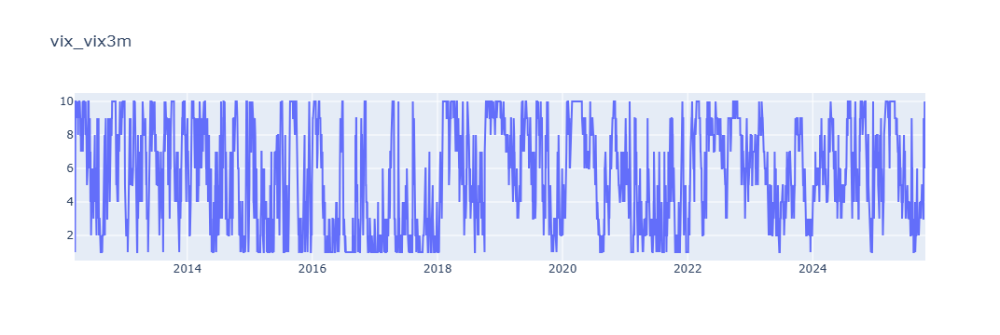

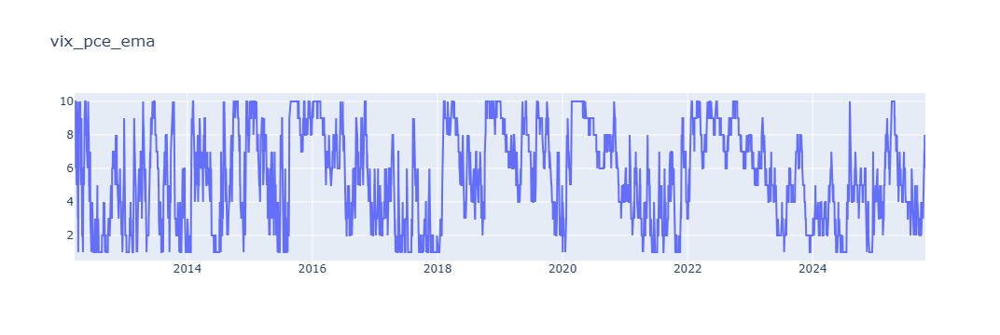

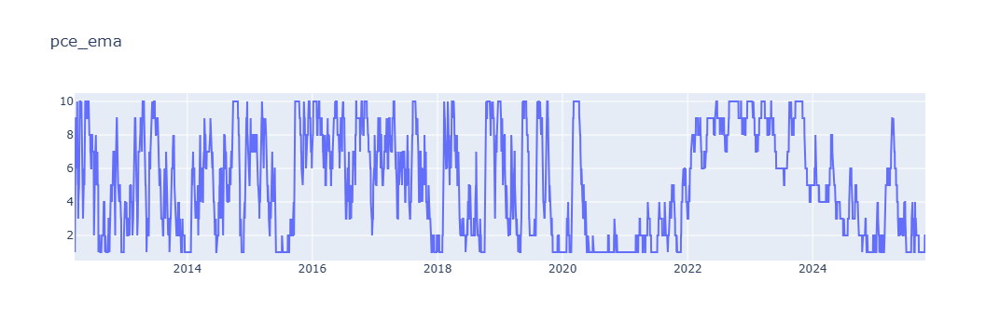

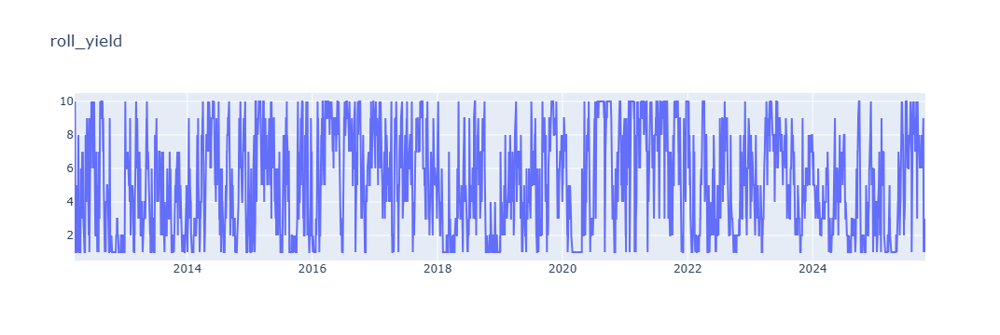

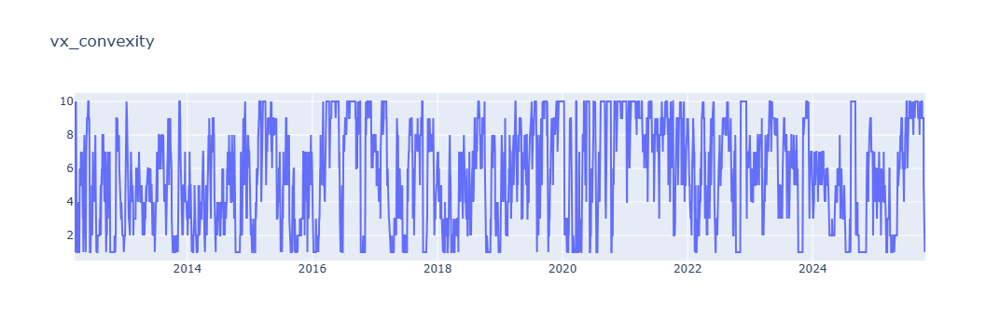

...

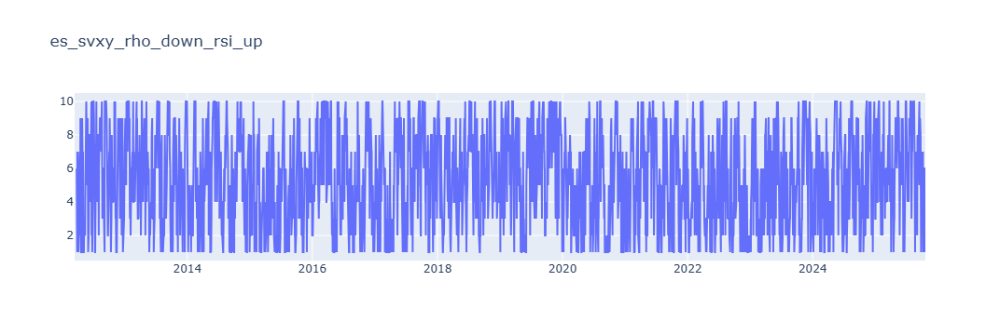

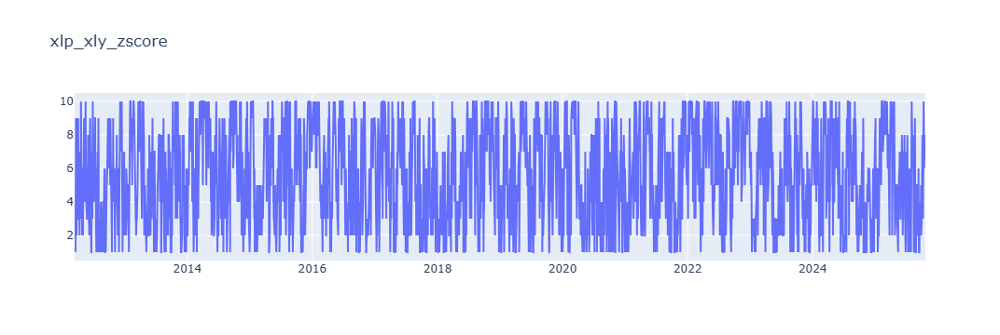

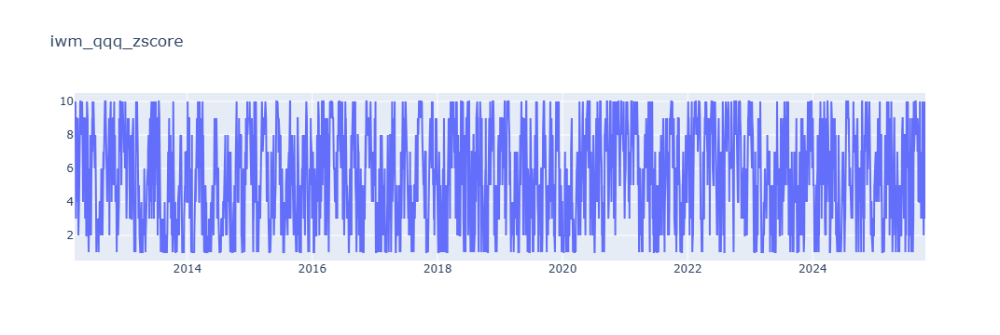

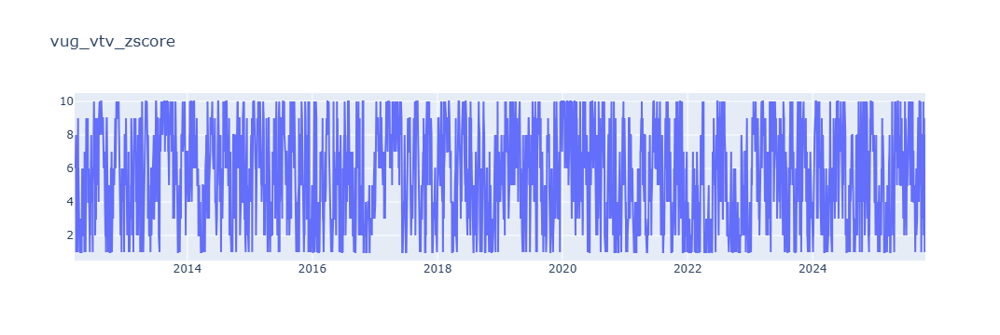

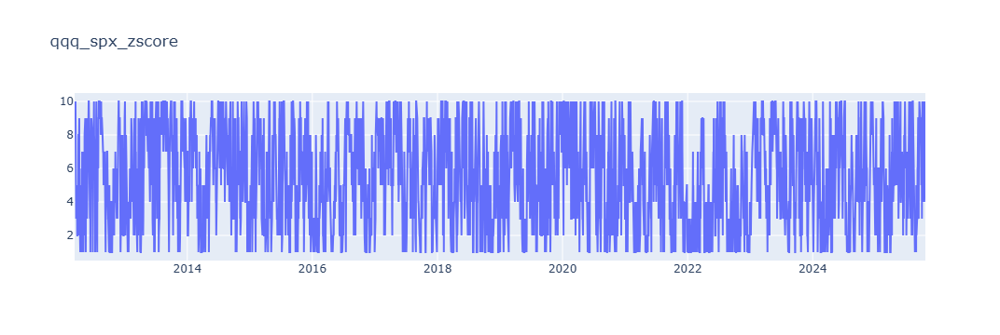

In [5]:
for signal in signals:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=data.date, y=data[f'{signal}']))
    fig.update_layout(title=signal)
    fig.show()

# <br><br> Alpha Report - Feature Predictive Power Analysis

This section runs a **quantitative alpha report** to assess each signal’s **predictive strength** versus the chosen target.  
It highlights which features truly carry **statistically significant information** beyond noise.

<br>1. **Basic Signal Quality Checks**
   - Detect **missing values** per feature.
   - Run **ADF stationarity tests** (`p < 0.05` → likely stationary).
   - Plot **Spearman correlation heatmap** to detect redundancy or collinearity.

<br>2. **Predictive Power via Randomization**
   - Compute:
     - **IC (Spearman correlation)** — linear directional strength.
     - **MI (Mutual Information)** — nonlinear dependency.
   - Perform **target-shuffling randomization** to get null distributions.
   - Derive **z-scores**:
     - `IC_z_abs` compares |IC| to |IC_rand|.
     - `MI_z` compares MI to MI_rand.
   - A signal is **Significant** if both exceed `z_thresh`.

<br>3. **Ranking & Summary Metrics**
   - **CompositePower** = |IC| + 0.5 × MI  
   - **AvgRank** = mean rank of |IC|, MI, and CompositePower.  
   - Table highlights top-ranked features and their significance.

<br>4. **Visualization**
   - **Compact 2×2 board** of IC, MI, CompositePower, and AvgRank (top-N).  
   - **Quintile plots** for decile-based signals:
     - Show average target per quintile.
     - **Blue = significant**, **Gray = non-significant**.


=== Missing Values (fraction) ===
es_svxy_rho_down_rsi_up             0.002
es_svxy_rho_down_es_up_skew_down    0.002
es_svxy_rho_down_es_up_skew_up      0.002
es_svxy_rho_down_es_up              0.002
es_svxy_rho                         0.002
es_svxy_rho                         0.002
pce_ema_zscore                      0.001
vix_vix3m_zscore                    0.001
vx_convexity_zscore                 0.001
vrp_1                               0.001
vug_vtv_zscore                      0.001
iwm_qqq_zscore                      0.001
xlp_xly_zscore                      0.001
qqq_spx_zscore                      0.001
vrp_2                               0.001
spx_zscore                          0.001
vix_zscore                          0.001
vix_pce_ema                         0.001
vx_convexity                        0.000
roll_yield                          0.000
dtype: float64

=== ADF Stationarity Test (p-values) ===
es_svxy_rho_down_rsi_up             0.0
es_svxy_rho_down_es_up_skew_

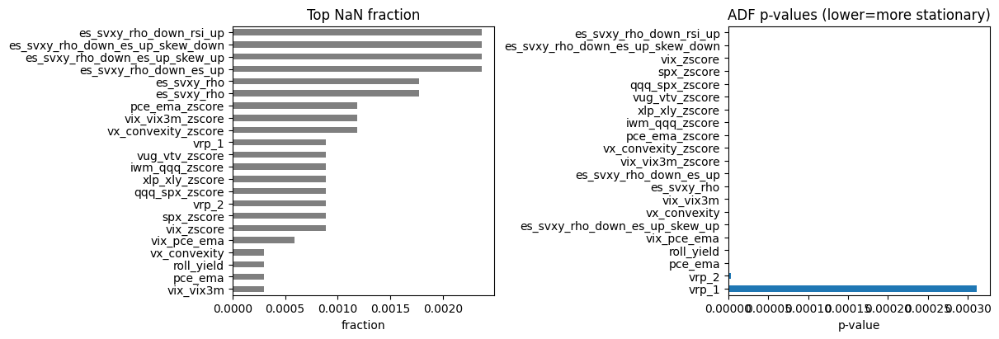

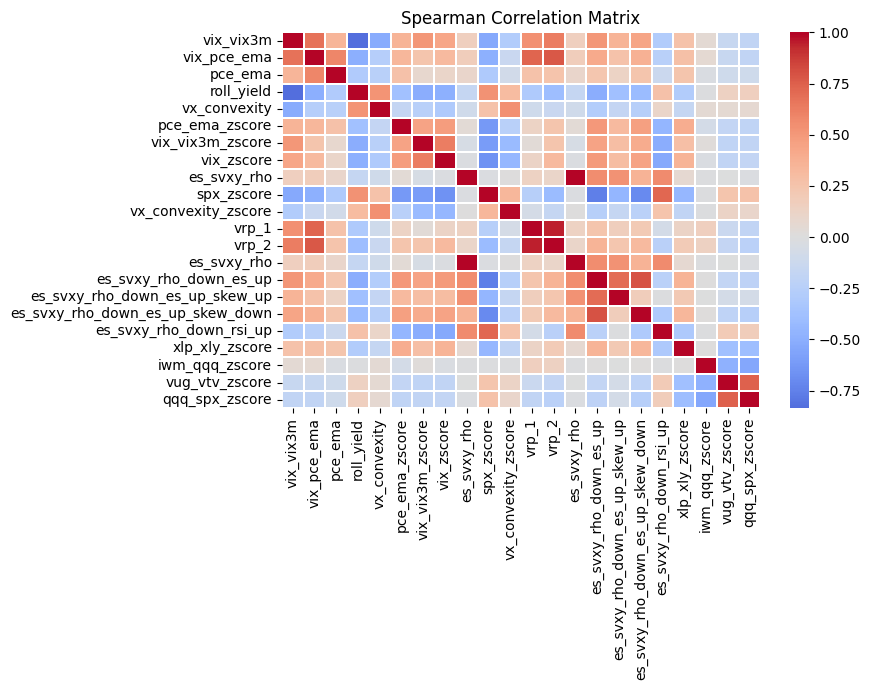


=== Predictive Power Summary (|IC| randomization; BOTH must pass) ===
                                      IC  IC_abs  IC_z_abs      MI    MI_z  \
Feature                                                                      
vix_pce_ema                      -0.0902  0.0902    8.0412  0.0443  6.0458   
vrp_2                            -0.0822  0.0822    6.6625  0.0490  5.9689   
vix_vix3m                        -0.0709  0.0709    5.3887  0.0490  5.8705   
vrp_1                            -0.0711  0.0711    5.8357  0.0445  4.9119   
spx_zscore                        0.0712  0.0712    4.8568  0.0323  3.3961   
roll_yield                        0.0570  0.0570    4.1811  0.0334  4.2527   
pce_ema                          -0.0693  0.0693    5.0552  0.0170  1.4878   
es_svxy_rho_down_es_up           -0.0438  0.0438    3.0641  0.0431  5.0871   
es_svxy_rho_down_rsi_up           0.0562  0.0562    4.1094  0.0213  2.2106   
vix_zscore                       -0.0441  0.0441    2.9108  0.0117  1.0

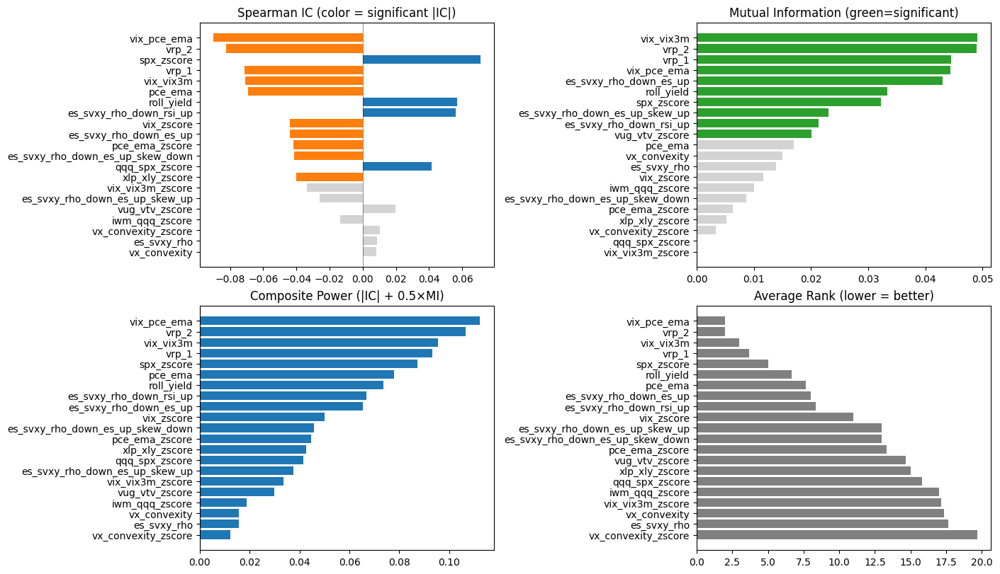

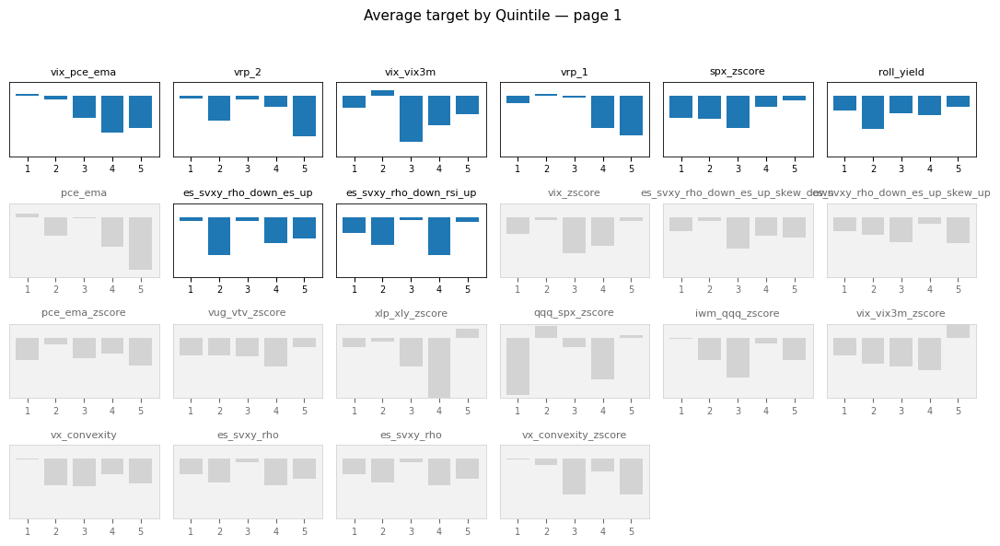

In [6]:
# ============================================
# Alpha Report (modular, compact)
# ============================================
# Usage:
# generate_alpha_report(data, target_col="target", signals=signals, n_iter=300, z_thresh=2.0, top_n=30)

# Example:
data['target'] = data['vixy'].pct_change().shift(-1)
generate_alpha_report(data, target_col="target", signals=signals, n_iter=300, z_thresh=2.0, top_n=30)